# Image Utilities

This example will describe how to manage metadata, crop, and annotate images with the Image Utilities widget. The widget can be opened from `Plugins --> nDev --> Image Utilities`. To crop layers in the viewer, open `Plugins --> crop region (napari_crop)`. Below, we load napari and open the Image Utilities Widget and load in a large image originally saved with the widget from a multi-scene CZI file. Note that currently no metadata populates the widget because the file was not selected with `Select Files`. Instead, the image was opened with the [`napari-bioio`](https://github.com/TimMonko/napari-bioio) plugin; however, the metadata is saved and could normally be accessed from `viewer.layers[n].metadata['bioimage']`.

To access metadata from any image in the viewer, press the `Selected Layer` button in the `Update Metadata from:` box. 

In [7]:
import pathlib

from bioio.writers import OmeTiffWriter

from napari_ndev import nImage

parent = pathlib.Path.cwd().parent
rel_path = 'images/2024-08-07 25x 48HIC NCOA4 647 FT 568 PHALL 488 DAPI OBL_scene_P8-C9.ome.tiff'

img = nImage(parent / rel_path)
img_data = img.get_image_data('TCZYX')

top_left = (319, 1814)
bottom_right = (942, 2316)

cropped_data = img_data[:, :, :, top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]]


OmeTiffWriter.save(
    uri=parent / 'images/cropped_neuron.ome.tiff',
    data=cropped_data,
    channel_names=img.channel_names,
    physical_pixel_sizes=img.physical_pixel_sizes,
)

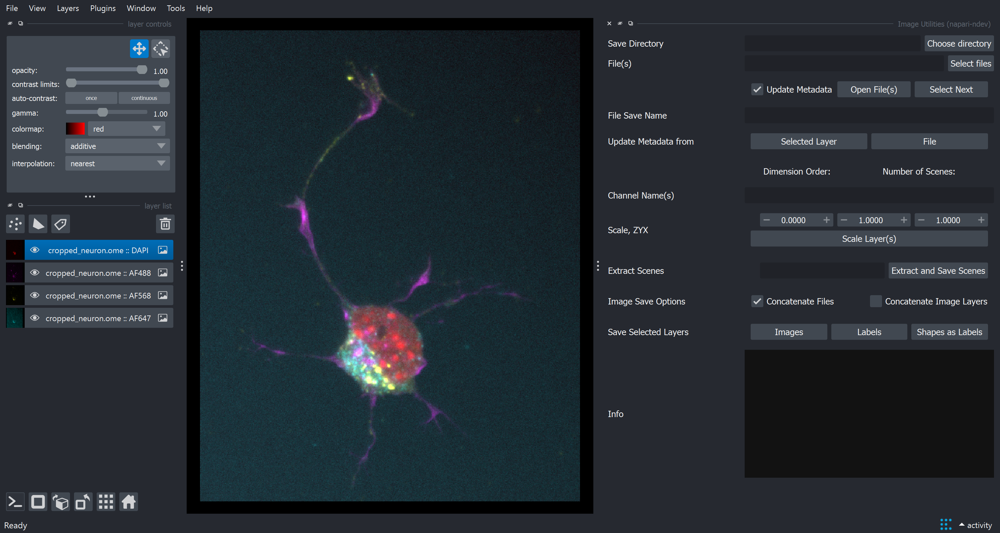

In [1]:
import pathlib

import napari
from napari.utils import nbscreenshot

parent = pathlib.Path.cwd().parent
rel_path = 'images/cropped_neuron.ome.tiff'

viewer = napari.Viewer()
viewer.window.resize(1500, 800) # w x h
viewer.window.add_plugin_dock_widget('napari-ndev', 'Image Utilities')
viewer.open(parent / rel_path, plugin='napari-bioio')

nbscreenshot(viewer)

## Update Metadata from layer

Now both Channel Name(s) and the Scale is shown


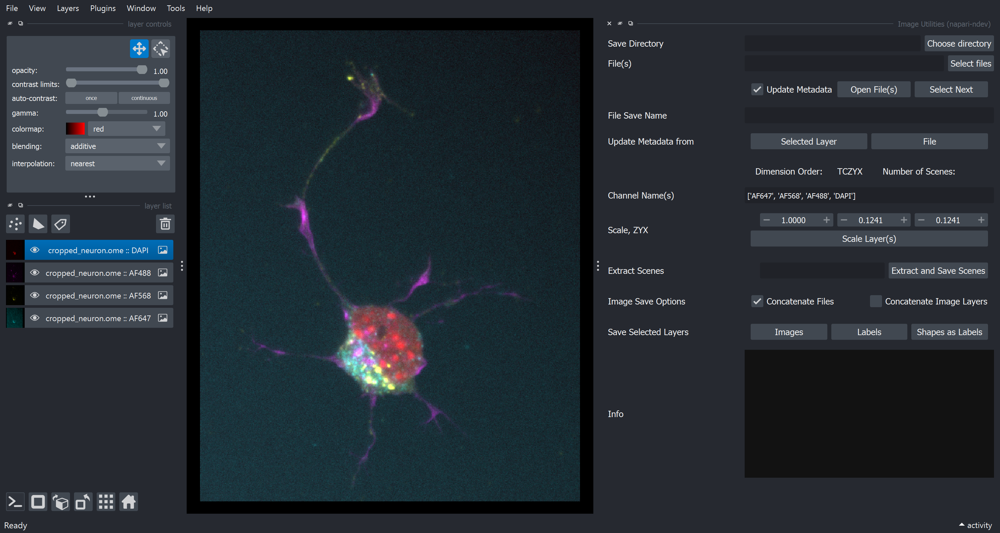

In [2]:
nbscreenshot(viewer)

## Updating Metadata Automatically with Widget File Selection

Select one or multiple files which *could* be opened into the viewer, but these files do not have to be in order to be saved.

To turn off auto metadata update on file selection uncheck `Update Metadata`. You may open the image (which will attempt to use `napari-aicsimageio`, if it exists, otherwise a different compatible reader) or `Select Next` and it will iterate to the next alpha-numerically sorted filename(s) matching the current number that are open. 

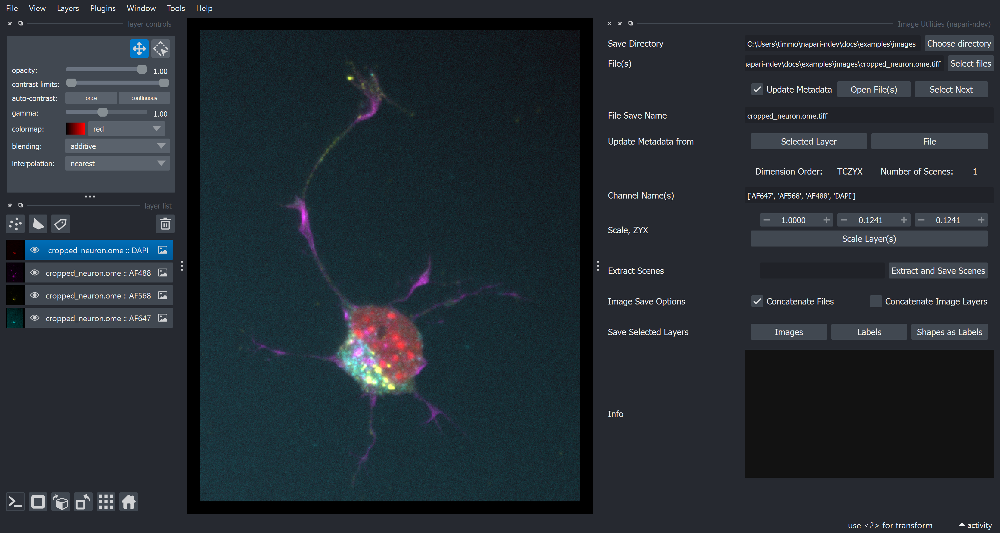

In [3]:
nbscreenshot(viewer)

## Concatenating Files and Saving Layers

`Concatenate Files` checkbox below allows saving of image data as OME-TIFF without empty channels. This could be useful if your microscope saves images as RGB with empty channels. Alternatively, if `Concatenate Layers` is checked then it will combine any layers selected in the left panel `layer list` of napari. Having both checked will stack the select file path with any select viewer layers, which could be useful if you wanted to process images and then combine with the original. 

All metadata is passed from the widget to `bioio.writers.OmeTiffWriter` to keep metadata and is used by all other widgets of the plugin. 

## Quick Annotation

Both the Shapes and Labels layers can be quickly drawn on to your image to annotate in whatever way suits your needs. 
Then, when the layer you want is selected hit the button in the widget to save your image, layer, or shape (which will be converted to a scaled label). Each 'Shape' will also get a corresponding label, allowing multi-ROI consistency across images. 

### Utilizing Shapes for future annotations
In order to re-use Shapes for future annotations (akin to an ImageJ/FIJI ROI), go to `File -> Save Selected Layer` and save the Shapes layer as a .CSV. When you load this .csv back into napari *it will always load with a scale of (1.0,1.0,1.0)* and you will thus need to select the shapes layer and `Scale Layer(s)` using the widget to re-size your annotation to the expected size. 


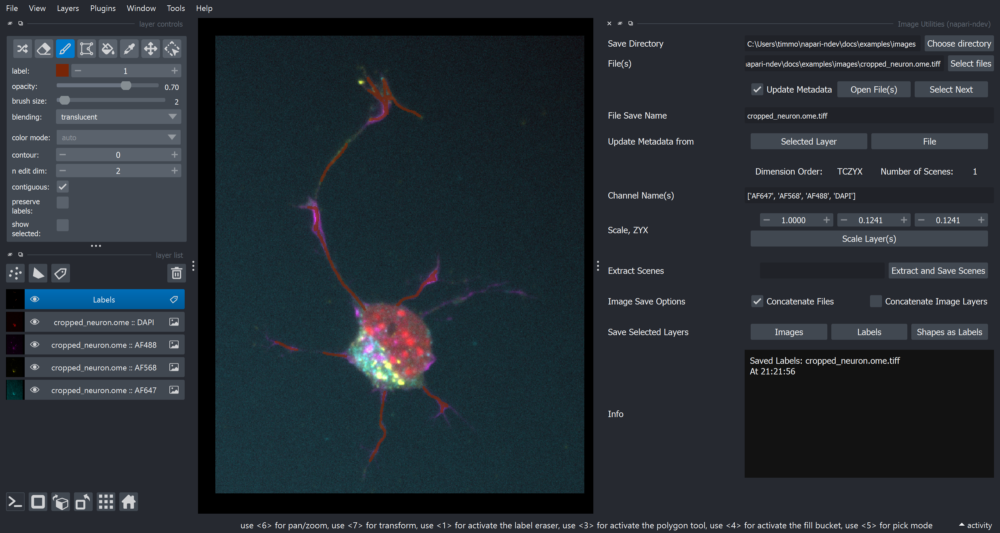

In [4]:
nbscreenshot(viewer)